In [10]:
import requests

r=requests.get("https://cds.climate.copernicus.eu/api/csw/v1/%20?service=CSW&version=3.0.0&request=GetRecordById&outputSchema=http://www.isotc211.org/2005/gmd&id=reanalysis-era5-single-levels&elementsetname=full")
dir(r)

['__attrs__',
 '__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__enter__',
 '__eq__',
 '__exit__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__nonzero__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_content',
 '_content_consumed',
 '_next',
 'apparent_encoding',
 'close',
 'connection',
 'content',
 'cookies',
 'elapsed',
 'encoding',
 'headers',
 'history',
 'is_permanent_redirect',
 'is_redirect',
 'iter_content',
 'iter_lines',
 'json',
 'links',
 'next',
 'ok',
 'raise_for_status',
 'raw',
 'reason',
 'request',
 'status_code',
 'text',
 'url']

In [21]:
root = ET.fromstring(r.text)
dir(root)

['__class__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'append',
 'attrib',
 'clear',
 'extend',
 'find',
 'findall',
 'findtext',
 'get',
 'insert',
 'items',
 'iter',
 'iterfind',
 'itertext',
 'keys',
 'makeelement',
 'remove',
 'set',
 'tag',
 'tail',
 'text']

In [ ]:
root.items() 

[('{http://www.w3.org/2001/XMLSchema-instance}schemaLocation',
  '             http://www.isotc211.org/2005/gmd http://www.isotc211.org/2005/gmd/gmd.xsd             http://www.isotc211.org/2005/gmx http://www.isotc211.org/2005/gmx/gmx.xsd')]

In [1]:
import os
import leafmap
from glob import glob
import geopandas as gpd 

os.chdir("/mnt/beegfs/lcesarini/2025_p_irio/")
# list_tiffs=glob("/home/lcesarini/Downloads/dem_tif_n60w090/*.tif")

# geojson = (
#     "https://github.com/opengeos/leafmap/raw/master/examples/data/countries.geojson"
# )

tif = "test/wind_global.nc"
# tif = "/home/lcesarini/Downloads/Event_40769_IT_Veneto_2010_River_4326.tif"
# points="/home/lcesarini/Downloads/test_100.gpkg"
# filename_ext = f"/home/lcesarini/project/Idrografia_bacini_principali.gpkg"


In [5]:

# gdf=gpd.read_file("/mnt/beegfs/lcesarini/2022_resilience/gadm36_ITA.gpkg",layer="gadm36_ITA_2")
gdf=gpd.read_file("/mnt/beegfs/lcesarini/HANZE/EXTENT/2015/Event_40840_IT_2015_River.shp")
# gdf[gdf.NAME_2.isin(['Vicenza','Padua','Verona'])].to_file("/mnt/beegfs/lcesarini/tmp/veneto_2010.gpkg")

In [6]:
gdf.explore()

In [ ]:
m = leafmap.Map(layers_control=True,zoom=5, center=(45.5, 11.5),height=850, width=1000)
m.add_basemap("CartoDB.DarkMatter")
# m.add_velocity(
#     tif,
#     zonal_speed="u_wind",
#     meridional_speed="v_wind",
#     color_scale=[
#         "rgb(0,0,150)",
#         "rgb(0,150,0)",
#         "rgb(255,255,0)",
#         "rgb(255,165,0)",
#         "rgb(150,0,0)",
#     ],
# )
m.add_vector("../tmp/veneto_2010.gpkg",layer_name='pistola',colors="red")
#m.add_vector(filename_ext,layer_name='bacini idrografici principali')
#m.add_geojson(geojson, layer_name="Countries",c='green')
m



In [2]:
import folium
import rasterio
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import xarray as xr
import rioxarray as rxr

colormap = cm.get_cmap('Blues')

In [3]:
PATH='/mnt/beegfs/lcesarini/HANZE/WD/river/2015/Event_40840_IT_2015_River.tif'
def get_img_bounds(path):

    # Load the raster data
    with rasterio.open(path) as src:
        image = src.read(1)
        bounds = src.bounds

    return image, bounds

In [4]:
image, bounds = get_img_bounds(PATH)

In [ ]:
import numpy as np
import os
os.chdir("/mnt/beegfs/lcesarini/2025_p_irio")


In [ ]:
# import geopandas as gpd
# gpd.read_file(filename_ext).to_file("/mnt/beegfs/lcesarini/tmp/river_2010.geojson",driver="GeoJSON",layer="river_2010")
shp_reg=gpd.read_file("res/gadm36_ITA.gpkg",layer="gadm36_ITA_1") 

shp_reg=shp_reg.to_crs(3035)
shp_reg.NAME_1[shp_reg.NAME_1=="Sicily"]="Sicilia"
shp_reg.NAME_1[shp_reg.NAME_1=="Apulia"]="Puglia"
shp_reg.NAME_1.unique()

array(['Abruzzo', 'Puglia', 'Basilicata', 'Calabria', 'Campania',
       'Emilia-Romagna', 'Friuli-Venezia Giulia', 'Lazio', 'Liguria',
       'Lombardia', 'Marche', 'Molise', 'Piemonte', 'Sardegna', 'Sicilia',
       'Toscana', 'Trentino-Alto Adige', 'Umbria', "Valle d'Aosta",
       'Veneto'], dtype=object)

In [ ]:
import numpy as np
import xarray as xr
import rioxarray as rxr
def repro_to_wgs84(path,NR,type_flood):
    """
    Reproject a raster file to EPSG:4326 and clip it to a specific region.
    Eventually will take a s_crs and t_srs as arguments to provide larger usage. 
    Also, eventually might use GDAL utilty from CLI directly.

    Parameters:
    path (str): Path to the raster file.
    NR (str): Name of the region to clip.
    type_flood (str): Type of flood event.

    Returns:
    xarray.DataArray: Clipped and reprojected raster data.
    """
    
    # Load the raster data
    wd=rxr.open_rasterio(path)
    # CLip the raster data to the region of interest
    wd_clip=wd.rio.clip(shp_reg[shp_reg.NAME_1==NR].geometry.values)
    # Put NAs for values lower than 0, and select the first band
    name_dim=wd_clip.dims[0]
    selection={name_dim:0}
    wd_clip=xr.where(wd_clip<0,np.nan,wd_clip).isel(**selection)
    wd_clip.rio.write_crs("EPSG:3035").rio.reproject("EPSG:4326").rio.to_raster(f'test/Event_{id}_IT_{NR}_{year}_{type_flood}_4326.tif')

    return wd_clip

In [ ]:
url1 = "https://opengeos.org/data/raster/landsat7.tif"
url2 = "https://opengeos.org/data/raster/srtm90.tif"
satellite = leafmap.download_file(url1, "landsat.tif")
dem = leafmap.download_file(url2, "dem.tif")

landsat.tif already exists. Skip downloading. Set overwrite=True to overwrite.
dem.tif already exists. Skip downloading. Set overwrite=True to overwrite.


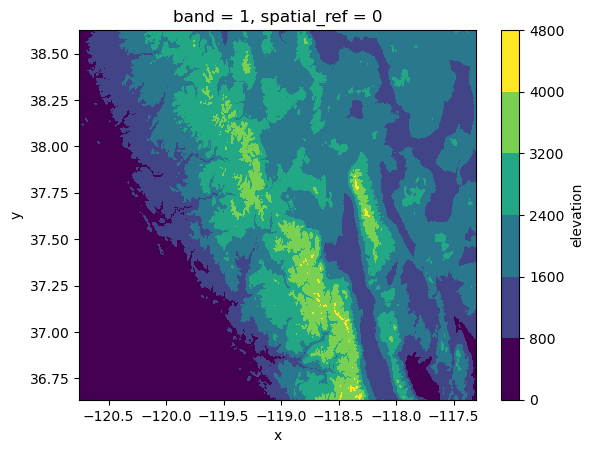

In [ ]:
rxr.open_rasterio(dem).isel(band=0).plot.contourf()

In [ ]:
import rasterio

year=2019
id=102656
NR="Veneto"
type_flood="Coastal"
# filename_ext = f"/mnt/beegfs/lcesarini//HANZE/EXTENT/{year}/Event_{id}_IT_{year}_River.shp"
# /mnt/beegfs/lcesarini//HANZE/EXTENT/2010/Event_40769_IT_2010_River.shp
filename_wd = f"/mnt/beegfs/lcesarini//HANZE/WD/{type_flood.lower()}/{year}/Event_{id}_IT_{year}_{type_flood}.tif"

# repro_to_wgs84(filename_wd,NR,type_flood)
# image, bounds = get_img_bounds(f'test/Event_{id}_IT_{NR}_{year}_{type_flood}_4326.tif')

In [ ]:
gdf=gpd.read_file("/mnt/beegfs/lcesarini/2025_p_irio/res/Idrografia_bacini_principali.gpkg")
imp_bac=["CEDRINO", "E POSADA", "FLUMINI MANNU"]
gdf[(gdf.nome_bac.isin(imp_bac)) + (gdf.nome_corso.isin(imp_bac))]

,gid,dgc_codice,id_bacino,nome_bac,nome_corso,foglio_igm,ordine,codifica,autorita,provenienz,modificato,note_modif,sina_bacin,perimetro,annotazion,st_area_sh,st_length_,geometry
24,25,41.0,0,CEDRINO,FIUME CEDRINO,NUORO,1,None,REGIONE SARDEGNA,None,SI,MODIFICATO LIMITE BACINO ALLA FOCE E PARTE SIN...,1.088284e+09,0.0,None,1.876873e+09,273467.284272,"MULTIPOLYGON (((9.36199 40.07562, 9.36236 40.0..."
34,35,9.0,0,E POSADA,RIU E POSADA,SASSARI,1,None,REGIONE SARDEGNA,None,SI,MODIFICATO LIMITE BACINO ALLA FOCE,7.027813e+08,0.0,None,1.211139e+09,195641.512874,"MULTIPOLYGON (((9.34508 40.58196, 9.34582 40.5..."
53,54,20.0,0,MANNU,FLUMINI MANNU,CAGLIARI,1,None,REGIONE SARDEGNA,None,SI,MODIFICATO LIMITE BACINO ALLA FOCE,1.779463e+09,0.0,None,2.894910e+09,359072.273817,"MULTIPOLYGON (((8.58045 39.44534, 8.58104 39.4..."
59,60,24.0,0,MANNU,FLUMINI MANNU,NUORO,1,None,REGIONE SARDEGNA,None,None,None,6.314942e+08,0.0,None,9.995085e+08,151688.478324,"MULTIPOLYGON (((8.55794 39.7014, 8.56446 39.70..."


In [ ]:
import rioxarray as rxr

clipped=rxr.open_rasterio(f'test/Event_{id}_IT_{NR}_{year}_{type_flood}_4326.tif')#.rio.clip(gdf[(gdf.nome_bac.isin(imp_bac)) + (gdf.nome_corso.isin(imp_bac))].geometry.values)
clipped.isel(band=0).values.shape

(1269, 1360)

In [ ]:
all_ul=gpd.read_file("/mnt/beegfs/lcesarini/2024_IRIO_EQ/res/Veneto_geocoded.gpkg")

In [ ]:
clipped.sel(x=12.417,y=45.486,method="nearest")

array([0.23389004], dtype=float32)

In [ ]:
fig,ax=plt.subplots(figsize=(10,10))

In [ ]:
wd=[clipped.sel(x=lon,y=lat, method="nearest").values.item() for lat,lon in zip(all_ul.geometry.y,all_ul.geometry.x)]

In [ ]:
all_ul['WD']=wd

In [ ]:
ul_wd=gpd.read_file('out/bilanci/Veneto_2019/Event_102656_IT_Veneto_2019_Coastal.gpkg')
ul_wd.head()

,row_id,cod_pro_formatted,cod_com2018_new,ateco_ul_2007,codice_impresa,codice_ul,codice_fiscale,ragione_sociale,cap,ateco_impresa_2007,...,cod_com2018,Citta,Indirizzo Originale,denom_prov,Indirizzo Finale,address,lng,lat,WD,geometry
0,1353345.0,023,023012,69201.0,23930034.0,2.0,FRRMNL79D07B107T,FERRARESE EMANUELE,37051,69201.0,...,23012.0,Bovolone,"VIA SIENA,28",VR,"VIA SIENA,28,37051 Bovolone,VR","Via Siena, Bovolone, Verona, Veneto, 37051, It...",11.135770,45.258969,NaN,POINT (11.13577 45.25897)
1,1353346.0,023,023012,43340.0,20010265.0,1.0,STRNCL74R21E512S,NICO DECORAZIONI DI STURARI NICOLA,37051,43340.0,...,23012.0,Bovolone,"VIA PRATO CASTELLO,12",VR,"VIA PRATO CASTELLO,12,37051 Bovolone,VR","Via Prato Castello, Crosare, Bovolone, Verona,...",11.112070,45.252361,NaN,POINT (11.11207 45.25236)
2,1353347.0,023,023012,56300.0,29890148.0,1.0,04290130238,G.T.A. S.N.C. DI ZAGO AMBRA E ZAGO GIADA,37051,56300.0,...,23012.0,Bovolone,"PIAZZA POZZA,4",VR,"PIAZZA POZZA,4,37051 Bovolone,VR","Piazza Pozza, Crosare, Bovolone, Verona, Venet...",11.121268,45.258852,NaN,POINT (11.12127 45.25885)
3,1353348.0,023,023012,47820.0,15068809.0,1.0,BRSMRA73A59B107K,BRESSAN MARA,37051,47820.0,...,23012.0,Bovolone,"VIA CROSARE,12/C",VR,"VIA CROSARE,1,37051 Bovolone,VR","Via Crosare, Crosare, Bovolone, Verona, Veneto...",11.116215,45.254777,NaN,POINT (11.11621 45.25478)
4,1353349.0,023,023012,56101.0,31627264.0,2.0,04526580230,DON PEDRO SOCIETA' A RESPONSABILITA' LIMITATA ...,37051,56101.0,...,23012.0,Bovolone,VIA MADONNA 353,VR,"VIA MADONNA,353,37051 Bovolone,VR","Via Madonna, Crosare, Bovolone, Verona, Veneto...",11.112479,45.263116,NaN,POINT (11.11248 45.26312)


In [ ]:
(ul_wd.WD > 3.5).sum()

np.int64(12)

In [ ]:
image,bounds = get_img_bounds(f'test/Event_{id}_IT_{NR}_{year}_{type_flood}_4326.tif')

In [ ]:
ul_wd.WD.notnull().sum()


np.int64(741)

In [2]:
colormap = cm.get_cmap('Blues',)

NameError: name 'cm' is not defined

In [ ]:
colormap = cm.linear.RdYlBu_11.scale(-1000, 1000)


NameError: name 'colormap' is not defined


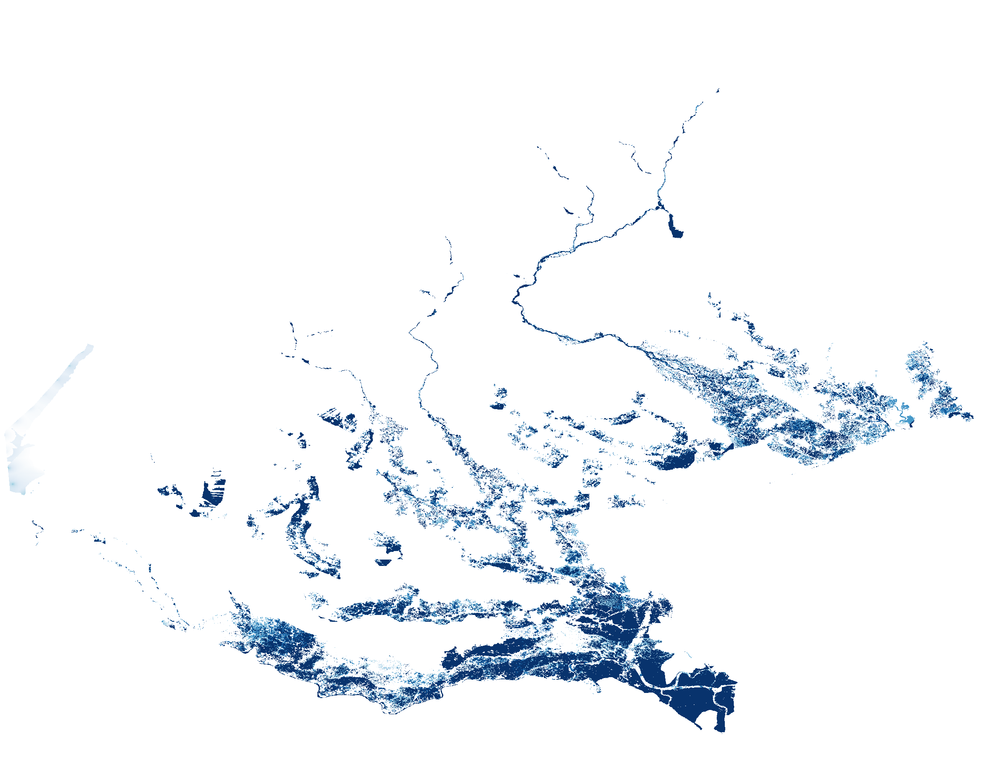

In [ ]:
fig = folium.Figure(width=400, height=300)  # in pixels
# Create a Folium map
m = folium.Map(location=[(bounds.top + bounds.bottom)/2, (bounds.left + bounds.right)/2], 
               zoom_start=10,
               tiles="Cartodb dark_matter")

folium.GeoJson(
    # gdf[(gdf.nome_bac.isin(imp_bac)) + (gdf.nome_corso.isin(imp_bac))],
    shp_reg[shp_reg.NAME_1==NR],
    style_function= lambda x: {
        'fillColor': '#ffaf00',
        'color': '#ffaf00',
        'weight': 2,
        'fillOpacity': 0.15
    },
    popup=folium.features.GeoJsonPopup(fields=shp_reg.columns.values.tolist()[:-1]),
    name='region'
).add_to(m)

# Add the raster data as an ImageOverlay
folium.raster_layers.ImageOverlay(
    # image=clipped.isel(band=0).values,
    # bounds=[[clipped.rio.bounds()[1], clipped.rio.bounds()[0]], [clipped.rio.bounds()[3], clipped.rio.bounds()[2]]],
    image=image,
    bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
    colormap=lambda x: colormap(x) if x > 0 else (0, 0, 0, 0),
    interactive=True,
    cross_origin=True,
    zindex=1
).add_to(m)


# folium.GeoJson(
#     ul_wd[~ul_wd.WD.isna()],
#     style_function= lambda x: {
#         'fillColor': '#ffaf00',
#         'color': '#ffaf00',
#         'weight': 2,
#         'fillOpacity': 0.15
#     },
#     popup=folium.features.GeoJsonPopup(fields=ul_wd.columns.values.tolist()[:-2]+['WD']),
#     name='flooded ul'
# ).add_to(m)

# folium.GeoJson(
#     hit_ul,
#     style_function= lambda x: {
#         'fillColor': '#ffaf00',
#         'color': '#ffaf00',
#         'weight': 2,
#         'fillOpacity': 0.15
#     },
#     popup=folium.features.GeoJsonPopup(fields=hit_ul.columns.values.tolist()[:-1]),
#     name='river_2010'
# ).add_to(m)

# folium.GeoJson(
#     all_ul,
#     marker=folium.Circle(radius=4, fill_color="orange", fill_opacity=0.4, color="black", weight=1),
# ).add_to(m)


# Create marker cluster
# marker_cluster = MarkerCluster().add_to(m)

# # Add markers to the cluster
# for lat, lon in zip(ul_wd[ul_wd.WD.isna()].geometry.y, ul_wd[ul_wd.WD.isna()].geometry.x):
#     folium.Circle([lat, lon],radius=4, fill_color="orange", fill_opacity=0.4, color="black", weight=1).add_to(marker_cluster)



# Display the map
m

In [ ]:
m.save(f'out/Event_{id}_IT_{NR}_{year}_River.html')


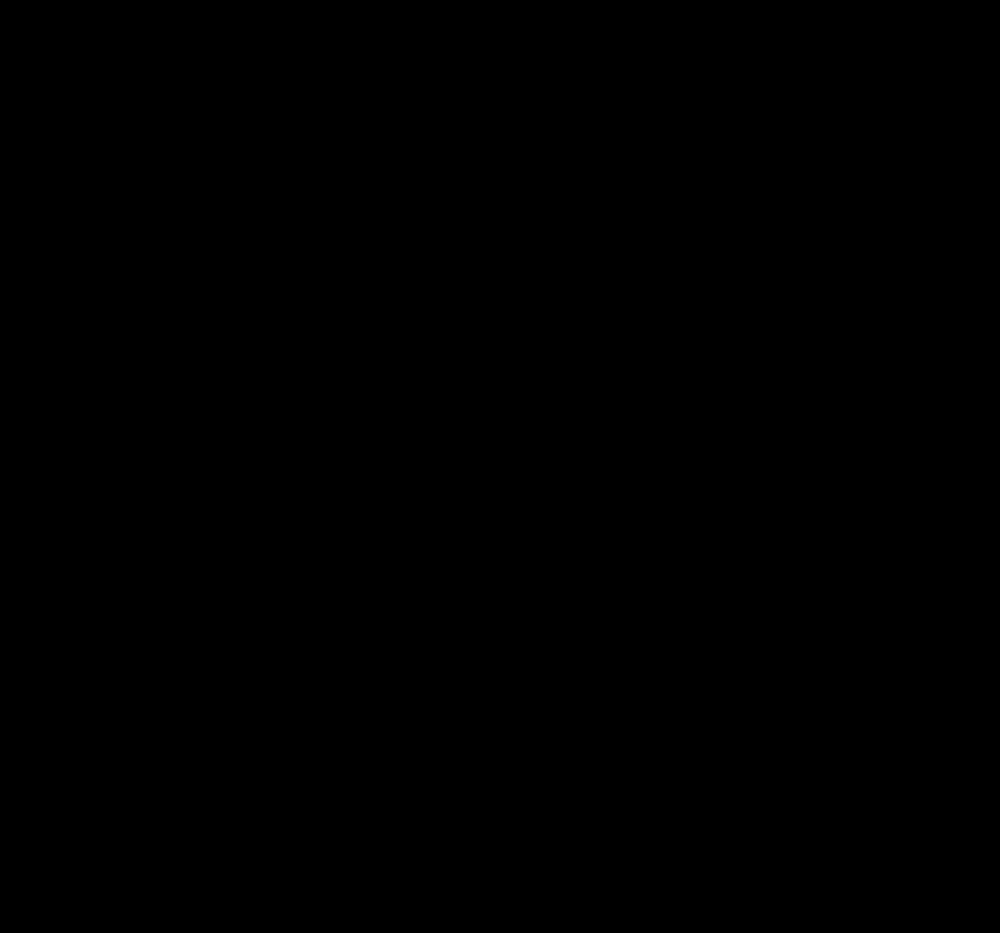

In [ ]:
import folium
import rasterio
from rasterio.plot import show

with rasterio.open(f'test/Event_{id}_IT_{NR}_{year}_{type_flood}_4326.tif') as src:
    bounds = src.bounds
    m = folium.Map(location=[(bounds.top + bounds.bottom)/2, (bounds.left + bounds.right)/2])
    folium.raster_layers.ImageOverlay(
        image=src.read(1),  # Band 1
        bounds=[[bounds.bottom, bounds.left], [bounds.top, bounds.right]],
        opacity=0.7
    ).add_to(m)
m

In [ ]:
import pandas as pd
gpd.read_file("/mnt/beegfs/lcesarini/2025_p_irio/out/vector/2018/EVENT_40869_2018_Piemonte_River_ul.gpkg").head()

,row_id,cod_pro_formatted,cod_com2018_new,ateco_ul_2007,codice_impresa,codice_ul,codice_fiscale,ragione_sociale,cap,ateco_impresa_2007,...,cod_com2018,Citta,Indirizzo.Originale,denom_prov,Indirizzo.Finale,address,lng,lat,WD,geometry
0,244321.0,004,004078,49322.0,25084255.0,2.0,03196850048,AL.MA. DI ZUCCHI MADDALENA & C. S.A.S. SIGLABI...,12100,49322.0,...,4078.0,Cuneo,"VIA ROCCA,116",CN,"VIA ROCCA,116,12100 Cuneo,CN","Via Rocca, Roata Caporalina, Roata Rossi, Cune...",7.527208,44.447283,1.777195,POINT (4123803.74 2373985.437)
1,244620.0,004,004078,74909.0,26651324.0,2.0,GRLNRC88M28D205Q,GARELLO ENRICO,12100,74909.0,...,4078.0,Cuneo,"VIA ROCCA,10",CN,"VIA ROCCA,10,12100 Cuneo,CN","Via Rocca, Roata Caporalina, Roata Rossi, Cune...",7.527208,44.447283,1.777195,POINT (4123803.74 2373985.437)
2,244921.0,004,004078,43210.0,21433829.0,2.0,RSSLCU70C31D205Q,ROSSO LUCA,12100,43210.0,...,4078.0,Cuneo,"VIA ROCCA,6",CN,"VIA ROCCA,6,12100 Cuneo,CN","Via Rocca, Roata Caporalina, Roata Rossi, Cune...",7.527208,44.447283,1.777195,POINT (4123803.74 2373985.437)
3,245377.0,004,004078,25110.0,1494965.0,1.0,MBRNZE58E30D205S,AMBROSINO ENZO,12100,25110.0,...,4078.0,Cuneo,"VIA ROCCA,48",CN,"VIA ROCCA,48,12100 Cuneo,CN","Via Rocca, Roata Caporalina, Roata Rossi, Cune...",7.527208,44.447283,1.777195,POINT (4123803.74 2373985.437)
4,245423.0,004,004078,43210.0,23488936.0,2.0,CSNMSM66T07D205W,CESANO ELETTROIMPIANTI DI CESANO MASSIMO,12100,43210.0,...,4078.0,Cuneo,"VIA ROCCA,34 G",CN,"VIA ROCCA,1,12100 Cuneo,CN","Via Rocca, Roata Caporalina, Roata Rossi, Cune...",7.527208,44.447283,1.777195,POINT (4123803.74 2373985.437)
